In [1]:
#INIT
import cv2
import numpy as np
import requests
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import sys
import datetime
from tensorflow import keras
from tensorflow.keras.models import Model
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import os
from tensorflow import keras
from tensorflow.keras.preprocessing import image

image_Carpetweeds_path = 'Ref_Images/Carpetweeds.jpg'
image_Carpetweeds = cv2.imread(image_Carpetweeds_path, cv2.IMREAD_COLOR)

image_Crabgrass_path = 'Ref_Images/Crabgrass.jpg'
image_Crabgrass = cv2.imread(image_Crabgrass_path, cv2.IMREAD_COLOR)

image_Eclipta_path = 'Ref_Images/Eclipta.jpeg'
image_Eclipta = cv2.imread(image_Eclipta_path, cv2.IMREAD_COLOR)

image_Goosegrass_path = 'Ref_Images/Goosegrass.jpg'
image_Goosegrass = cv2.imread(image_Goosegrass_path, cv2.IMREAD_COLOR)

image_Morningglorry_path = 'Ref_Images/Morningglory.jpg'
image_Morningglorry = cv2.imread(image_Morningglorry_path, cv2.IMREAD_COLOR)

image_Nutsedge_path = 'Ref_Images/Nutsedge.jpg'
image_Nutsedge = cv2.imread(image_Nutsedge_path, cv2.IMREAD_COLOR)

image_PalmerAmaranth_path = 'Ref_Images/PalmerAmaranth.jpg'
image_PalmerAmaranth = cv2.imread(image_PalmerAmaranth_path, cv2.IMREAD_COLOR)

image_PricklySida_path = 'Ref_Images/PricklySida.jpg'
image_PricklySida = cv2.imread(image_PricklySida_path, cv2.IMREAD_COLOR)

image_Purslane_path = 'Ref_Images/Purslane.jpg'
image_Purslane = cv2.imread(image_Purslane_path, cv2.IMREAD_COLOR)

image_Ragweed_path = 'Ref_Images/Ragweed.jpg'
image_Ragweed = cv2.imread(image_Ragweed_path, cv2.IMREAD_COLOR)

image_Slicklepod_path = 'Ref_Images/Slicklepod.jpg'
image_Slicklepod = cv2.imread(image_Slicklepod_path, cv2.IMREAD_COLOR)

image_SpottedSpurge_path = 'Ref_Images/SpottedSpurge.jpeg'
image_SpottedSpurge = cv2.imread(image_SpottedSpurge_path, cv2.IMREAD_COLOR)

image_SpurredAnoda_path = 'Ref_Images/SpurredAnoda.jpg'
image_SpurredAnoda = cv2.imread(image_SpurredAnoda_path, cv2.IMREAD_COLOR)

image_Swinecress_path = 'Ref_Images/Swinecress.jpg'
image_Swinecress = cv2.imread(image_Swinecress_path, cv2.IMREAD_COLOR)

image_Waterhemp_path = 'Ref_Images/Waterhemp.jpeg'
image_Waterhemp = cv2.imread(image_Waterhemp_path, cv2.IMREAD_COLOR)


In [2]:
# # code pour augmenter la taille de notre dataset, nous modifions les images par une simple rotation
# import cv2
# import os
# import numpy as np
# from tqdm import tqdm

# # input files for new images
# input_dir = 'datasets/CottonWeedID15/SpurredAnoda/'

# # output files for new images
# output_dir = 'datasets/new/'

# num_augmentations = 1

# def augment_image(image, output_path):
#     if image is not None:
# # Generate a random rotation angle between 0 and 360 degrees
#         angle = np.random.randint(0, 360)

#         # Appliquez la rotation à l'image en utilisant l'angle aléatoire
#         rotated_image = cv2.warpAffine(image, cv2.getRotationMatrix2D((image.shape[1] / 2, image.shape[0] / 2), angle, 1), (image.shape[1], image.shape[0]))

#         # Sauvegarde de l'image modifiée
#         cv2.imwrite(output_path, rotated_image)
#     else:
#         print(f"Impossible de lire l'image {output_path}")

# for filename in tqdm(os.listdir(input_dir)):
#     if filename.endswith(('.jpg', '.jpeg', '.png')):  # sure that file is a picture
#         input_path = os.path.join(input_dir, filename)
#         image = cv2.imread(input_path)

#         for i in range(num_augmentations):
#             output_filename = f"{filename.split('.')[0]}_{i+num_augmentations}.{filename.split('.')[-1]}"
#             output_path = os.path.join(output_dir, output_filename)
#             augment_image(image, output_path)




In [14]:
import pathlib
import os
import zipfile
import tensorflow as tf
data_dir = pathlib.Path('datasets_cnn/CottonWeedID15')
print(data_dir)


datasets_cnn\CottonWeedID15


In [5]:
batch_size = 64
img_height = 200
img_width = 200

# Load the data for the selected classes
train_data = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="training",
    seed=42,
    image_size=(img_height, img_width),
    batch_size=batch_size,
)

val_data = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="validation",
    seed=42,
    image_size=(img_height, img_width),
    batch_size=batch_size
)

# Print class names to verify
class_names = val_data.class_names
print(class_names)


Found 16416 files belonging to 15 classes.
Using 13133 files for training.
Found 16416 files belonging to 15 classes.
Using 3283 files for validation.
['Carpetweeds', 'Crabgrass', 'Eclipta', 'Goosegrass', 'Morningglory', 'Nutsedge', 'PalmerAmaranth', 'Prickly Sida', 'Purslane', 'Ragweed', 'Sicklepod', 'SpottedSpurge', 'SpurredAnoda', 'Swinecress', 'Waterhemp']


In [6]:
from tensorflow import keras
from tensorflow.keras import layers
import time
from tensorflow.keras.callbacks import TensorBoard
num_classes = len(class_names)

model = keras.Sequential([
    layers.experimental.preprocessing.Rescaling(1./255),
    layers.Conv2D(128, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(16, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(num_classes, activation='softmax')
])

model.compile(optimizer='adam',
            loss=keras.losses.SparseCategoricalCrossentropy(
                #from_logits=True
                ),
            metrics=['accuracy'])

# logdir = "logs"
NAME = "cottonweed-{}".format(int(time.time()))

# tensorboard = keras.callbacks.TensorBoard(log_dir=logdir, histogram_freq=1, write_images=True)
tensorboard = TensorBoard(log_dir='logs/{}'.format(NAME))

model.fit(train_data, validation_data=val_data, epochs=10, callbacks=[tensorboard])
 
model.save("3par3.h5")

# model = keras.Sequential([
#     layers.experimental.preprocessing.Rescaling(1./255),
#     layers.Conv2D(128, 4, activation='relu', padding='same'),
#     layers.BatchNormalization(),
#     layers.MaxPooling2D(),
#     layers.Conv2D(256, 4, activation='relu', padding='same'),  # Augmentation du nombre de filtres
#     layers.BatchNormalization(),
#     layers.MaxPooling2D(),
#     layers.Conv2D(128, 4, activation='relu', padding='same'),  # Augmentation du nombre de filtres
#     layers.BatchNormalization(),
#     layers.MaxPooling2D(),
#     layers.Conv2D(64, 4, activation='relu', padding='same'),   # Augmentation du nombre de filtres
#     layers.BatchNormalization(),
#     layers.MaxPooling2D(),
#     layers.Flatten(),
#     layers.Dense(256, activation='relu'),  # Augmentation du nombre de neurones
#     layers.BatchNormalization(),
#     layers.Dense(128, activation='relu'),  # Augmentation du nombre de neurones
#     layers.BatchNormalization(),
#     layers.Dense(num_classes, activation='softmax')
# ])

# model.save("batch64epoch3_modified.h5")


Epoch 1/10


206/206 [==============================] - 735s 4s/step - loss: 2.5082 - accuracy: 0.1703 - val_loss: 2.2632 - val_accuracy: 0.2690
Epoch 2/10
206/206 [==============================] - 721s 3s/step - loss: 2.1145 - accuracy: 0.3107 - val_loss: 2.0514 - val_accuracy: 0.3268
Epoch 3/10
206/206 [==============================] - 694s 3s/step - loss: 1.8836 - accuracy: 0.3861 - val_loss: 1.9183 - val_accuracy: 0.3811
Epoch 4/10
206/206 [==============================] - 640s 3s/step - loss: 1.7194 - accuracy: 0.4449 - val_loss: 1.8212 - val_accuracy: 0.4197
Epoch 5/10
206/206 [==============================] - 657s 3s/step - loss: 1.5570 - accuracy: 0.4980 - val_loss: 1.7614 - val_accuracy: 0.4462
Epoch 6/10
206/206 [==============================] - 622s 3s/step - loss: 1.4319 - accuracy: 0.5413 - val_loss: 1.7013 - val_accuracy: 0.4569
Epoch 7/10
206/206 [==============================] - 613s 3s/step - loss: 1.2972 - accuracy: 0.5824 - val_loss: 1.6701 - val_accuracy: 0.4864
Epoch 8/10

c:\Users\ambro\OneDrive\Bureau\CNN\myenv\Lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [6]:
%reload_ext tensorboard
%tensorboard --logdir logs --port 6006

In [9]:
#TEST

test_loss, test_accuracy = model.evaluate(val_data)
print(f"Test accuracy: {test_accuracy}")

52/52 [==============================] - 43s 747ms/step - loss: 1.7143 - accuracy: 0.5035
Test accuracy: 0.5035029053688049


In [71]:
import os
import shutil

def deplacer_fichiers(source_dir, destination_dir, nombre_fichier=300):

    fichiers = os.listdir(source_dir)
    # Tri des fichiers pour assurer un ordre stable
    fichiers.sort()

    # Itère à travers les premiers 'nombre_fichiers' fichiers
    for i, fichier in enumerate(fichiers[:200], start=1):
        nom_fichier, extension = os.path.splitext(fichier)
        nombre_fichiers_source = os.path.getsize(destination_dir)
        nouveau_nom = f"{2800+i}.{extension}"  # Renomme le fichier
        chemin_source = os.path.join(source_dir, fichier)
        chemin_destination = os.path.join(destination_dir, nouveau_nom)

        shutil.copy(chemin_source, chemin_destination)

deplacer_fichiers("datasets_cnn/CottonWeedID15/Waterhemp", "datasets_cnn/test")
#['Carpetweeds', 'Crabgrass', 'Eclipta', 'Goosegrass', 'Morningglory', 'Nutsedge', 'PalmerAmaranth', 'PricklySida', 'Purslane', 'Ragweed', 'Sicklepod', 'SpottedSpurge', 'SpurredAnoda', 'Swinecress', 'Waterhemp']


In [3]:
labels_file = []
# Generate test labels
for i in range(15):
    labels_file.extend([i] * 200)


In [3]:
#1 fichier_save = os.path.abspath("batch64epoch20.h5")
fichier_save = os.path.abspath("batch64_epoch10.h5")
model = keras.models.load_model(fichier_save)

In [84]:
import cv2
import numpy as np
from keras.models import load_model
import os

# Initialize the confusion matrix
num_classes = 15  # Assuming there are 15 classes
matrix_confusion = np.zeros((num_classes, num_classes), dtype=int)

# Test image directory
test_dir = "datasets_cnn/test"
i=0
cmp =0
# Iterate through test images
for file in os.listdir(test_dir):
    file_path = os.path.join(test_dir, file)
    image_to_predict = cv2.imread(file_path, cv2.IMREAD_COLOR)
    img_to_predict = np.expand_dims(cv2.resize(image_to_predict, (200, 200)), axis=0)
    predictions = model.predict(img_to_predict)
    predicted_class = np.argmax(predictions)
    label = labels_file[i]
    i+=1
    # Update confusion matrix
    
    if 4 < label < 11 :
        matrix_confusion[label][predicted_class-4] += 1 # avant -7 
    elif ( 5 <= label <= 10):
        matrix_confusion[label][predicted_class-4] += 1 # avant -3 #ne plus toucher
    else :
        matrix_confusion[label][predicted_class-5] += 1 # ne pas toucher #-4

print(matrix_confusion)


1/1 [==============================] - 0s 52ms/step
[[ 51   3   8   6   2   3  39  12   1  26   0  22  13  13   1]
 [  6  60   8  15  14   2  21   7   8  25   1  18   6   8   1]
 [  5  25  52  30  13   6  19   1   5  13   0  12  12   2   5]
 [  3  12  27  90   6   3  27   3   7  11   0   4   4   0   3]
 [  4   8   4  79  24   4  21   2  12  11   0  20   6   4   1]
 [  0   2   6  12  10  32  52   3  18  10   8   1  20  12  14]
 [  0   1   5  24  25   2  66  36   5   5   8   0  12  10   1]
 [  0   3  11   7  26   3   4  88   6   8  12   0  23   4   5]
 [  2   3   3  14  15   5  12   7  93  12  10   0   9  12   3]
 [  0   0   0   2  11   1   0   7   0 142  12   0  15   1   9]
 [  1   2  11   2  27   8   0  10   2   9  91   1  24   5   7]
 [  1   4   6  14   6   4  14   1  10  30   0  68  29  12   1]
 [  2   4  18  11   2   4  11   8   2  17   0  18  91  12   0]
 [  1   2   6  12   3   3  20   3  16  24   0  26   7  68   9]
 [  2  27  18  23   3  11  10  21   0   9   2   1   7   0  66]]


In [85]:
print(matrix_confusion)

[[ 51   3   8   6   2   3  39  12   1  26   0  22  13  13   1]
 [  6  60   8  15  14   2  21   7   8  25   1  18   6   8   1]
 [  5  25  52  30  13   6  19   1   5  13   0  12  12   2   5]
 [  3  12  27  90   6   3  27   3   7  11   0   4   4   0   3]
 [  4   8   4  79  24   4  21   2  12  11   0  20   6   4   1]
 [  0   2   6  12  10  32  52   3  18  10   8   1  20  12  14]
 [  0   1   5  24  25   2  66  36   5   5   8   0  12  10   1]
 [  0   3  11   7  26   3   4  88   6   8  12   0  23   4   5]
 [  2   3   3  14  15   5  12   7  93  12  10   0   9  12   3]
 [  0   0   0   2  11   1   0   7   0 142  12   0  15   1   9]
 [  1   2  11   2  27   8   0  10   2   9  91   1  24   5   7]
 [  1   4   6  14   6   4  14   1  10  30   0  68  29  12   1]
 [  2   4  18  11   2   4  11   8   2  17   0  18  91  12   0]
 [  1   2   6  12   3   3  20   3  16  24   0  26   7  68   9]
 [  2  27  18  23   3  11  10  21   0   9   2   1   7   0  66]]


In [91]:
matrix_conf = [
    [51, 3, 8, 6, 2, 3, 39, 12, 1, 26, 0, 22, 13, 13, 1],
    [6, 60, 8, 15, 14, 2, 21, 7, 8, 25, 1, 18, 6, 8, 1],
    [5, 25, 52, 30, 13, 6, 19, 1, 5, 13, 0, 12, 12, 2, 5],
    [3, 12, 27, 90, 6, 3, 27, 3, 7, 11, 0, 4, 4, 0, 3],
    [1, 4, 8, 4, 79, 24, 4, 21, 2, 12, 11, 0, 20, 6, 4],
    [0, 2, 6, 12, 10, 32, 52, 3, 18, 10, 8, 1, 20, 12, 14],
    [0, 1, 5, 24, 25, 2, 66, 36, 5, 5, 8, 0, 12, 10, 1],
    [0, 3, 11, 7, 26, 3, 4, 88, 6, 8, 12, 0, 23, 4, 5],
    [2, 3, 3, 14, 15, 5, 12, 7, 93, 12, 10, 0, 9, 12, 3],
    [0, 0, 0, 2, 11, 1, 0, 7, 0, 142, 12, 0, 15, 1, 9],
    [1, 2, 11, 2, 27, 8, 0, 10, 2, 9, 91, 1, 24, 5, 7],
    [1, 4, 6, 14, 6, 4, 14, 1, 10, 30, 0, 68, 29, 12, 1],
    [2, 4, 18, 11, 2, 4, 11, 8, 2, 17, 0, 18, 91, 12, 0],
    [1, 2, 6, 12, 3, 3, 20, 3, 16, 24, 0, 26, 7, 68, 9],
    [2, 27, 18, 23, 3, 11, 10, 21, 0, 9, 2, 1, 7, 0, 66]
]


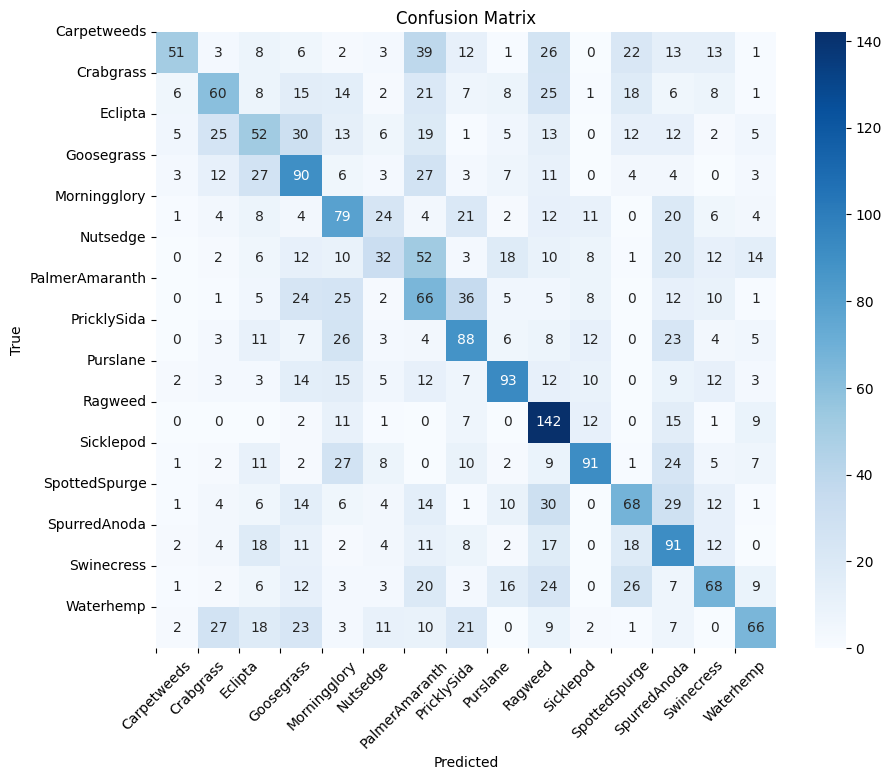

In [100]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define class names
class_names = ['Carpetweeds', 'Crabgrass', 'Eclipta', 'Goosegrass', 'Morningglory', 'Nutsedge', 'PalmerAmaranth', 'PricklySida', 'Purslane', 'Ragweed', 'Sicklepod', 'SpottedSpurge', 'SpurredAnoda', 'Swinecress', 'Waterhemp']

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(matrix_conf, annot=True, fmt='d', cmap='Blues')
plt.xticks(ticks=range(len(class_names)), labels=class_names, rotation=45)
plt.yticks(ticks=range(len(class_names)), labels=class_names, rotation=0)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
import os
from tensorflow import keras

fichier_save = os.path.abspath("batch64_epoch10.h5")
print(fichier_save)
model = keras.models.load_model(fichier_save)
model.summary()

c:\Users\ambro\OneDrive\Bureau\CNN\batch64_epoch10.h5
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_4 (Rescaling)     (None, 200, 200, 3)       0         
                                                                 
 conv2d_16 (Conv2D)          (None, 197, 197, 128)     6272      
                                                                 
 max_pooling2d_16 (MaxPooli  (None, 98, 98, 128)       0         
 ng2D)                                                           
                                                                 
 conv2d_17 (Conv2D)          (None, 95, 95, 64)        131136    
                                                                 
 max_pooling2d_17 (MaxPooli  (None, 47, 47, 64)        0         
 ng2D)                                                           
                                                                 


###############################################  0  ######################################################


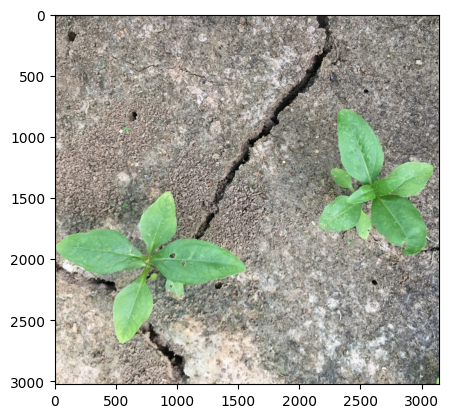

1/1 [==============================] - 0s 51ms/step
6.659805421804776e-06
Class probabilities: [[6.6598054e-06 6.5873377e-02 5.9503412e-01 6.7861925e-04 1.4140026e-01
  1.8241003e-02 4.8484144e-05 1.0803519e-01 1.9653933e-03 2.1624328e-03
  5.6923255e-02 2.0325917e-04 3.7640770e-04 5.8195167e-07 9.0508293e-03]]
Predicted class index: 2
Eclipta Ref_Images/Eclipta.jpeg


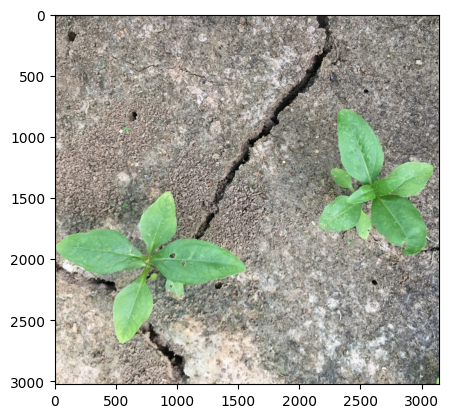

###############################################  1  ######################################################


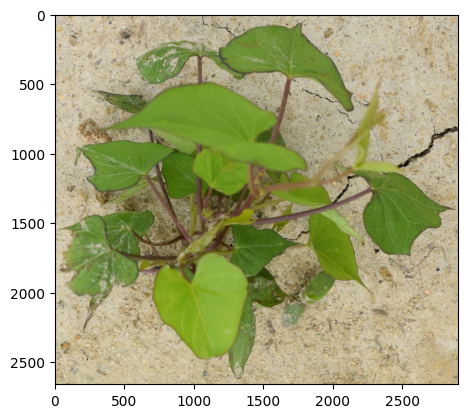

1/1 [==============================] - 0s 74ms/step
0.0002881684631574899
Class probabilities: [[2.8972363e-04 2.8816846e-04 1.8069228e-02 2.1169631e-06 4.2589986e-01
  3.3660972e-04 1.3801215e-02 2.1355856e-02 9.0625539e-02 7.5797737e-04
  6.3492700e-02 5.4703471e-03 3.5342062e-01 8.0031611e-04 5.3897761e-03]]
Predicted class index: 4
Morningglory Ref_Images/Morningglory.jpg


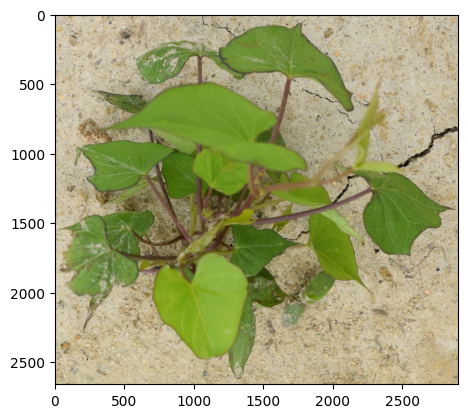

###############################################  2  ######################################################


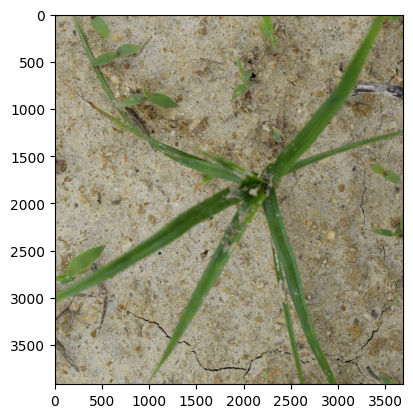

1/1 [==============================] - 0s 56ms/step
0.012291448190808296
Class probabilities: [[6.2838459e-04 2.9425266e-01 1.2291448e-02 1.5450782e-01 9.7393052e-04
  3.3496320e-01 4.4071270e-04 1.9426795e-04 3.2099443e-03 9.7984904e-03
  3.6496561e-04 1.4306988e-02 7.3043566e-06 2.9867672e-04 1.7376125e-01]]
Predicted class index: 5
Nutsedge Ref_Images/Nutsedge.jpg


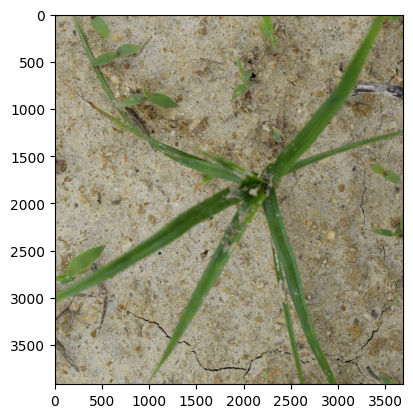

###############################################  3  ######################################################


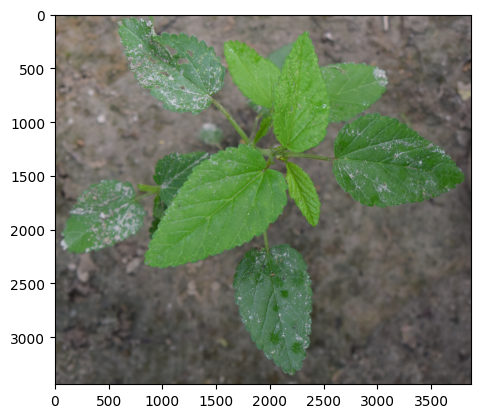

1/1 [==============================] - 0s 47ms/step
2.7122530354972696e-07
Class probabilities: [[4.7580311e-06 1.1297887e-04 1.9694108e-03 2.7122530e-07 2.3191778e-02
  3.6234615e-05 1.1813050e-02 6.9469720e-01 5.5868255e-05 9.6667018e-03
  2.4757922e-01 5.1274241e-05 3.4193199e-03 1.6200778e-05 7.3857410e-03]]
Predicted class index: 7
PricklySida Ref_Images/PricklySida.jpg


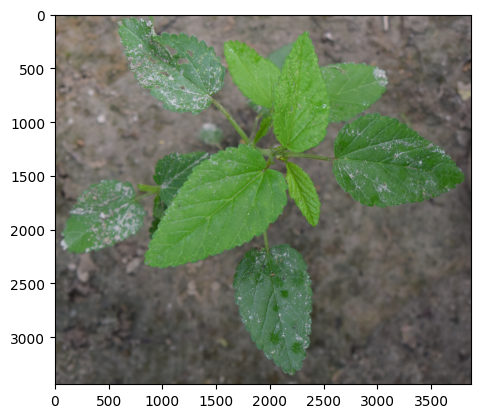

###############################################  4  ######################################################


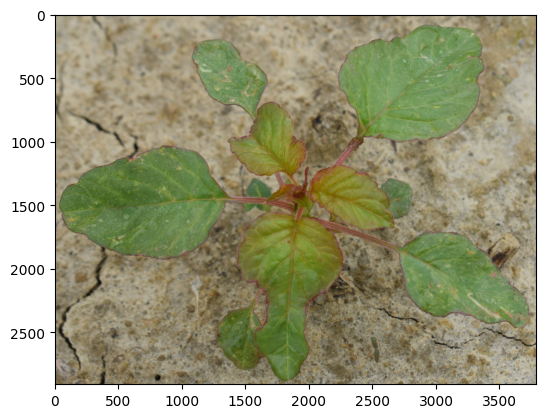

1/1 [==============================] - 0s 110ms/step
0.0881485790014267
Class probabilities: [[1.1488341e-03 2.6665265e-03 5.7882417e-02 1.1312738e-04 8.8148579e-02
  8.4428082e-04 2.8555021e-01 4.8029371e-02 8.6934075e-02 2.6289965e-03
  8.1275441e-02 1.8822756e-01 7.9545073e-02 1.9789200e-02 5.7216406e-02]]
Predicted class index: 6
PalmerAmaranth Ref_Images/PalmerAmaranth.jpg


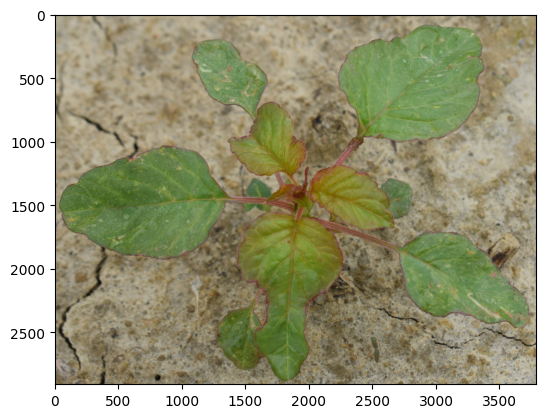

###############################################  5  ######################################################


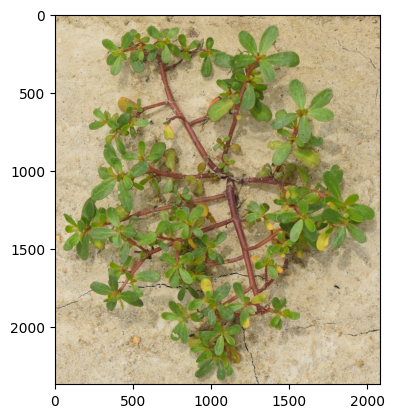

1/1 [==============================] - 0s 68ms/step
0.026048650965094566
Class probabilities: [[9.9683362e-05 7.3231503e-02 1.6779238e-02 2.4405010e-03 9.4293682e-03
  2.6048651e-02 2.0942405e-01 1.5610012e-02 6.9363311e-02 2.3063822e-01
  8.9257114e-02 2.1096475e-01 8.2036769e-03 1.1267869e-02 2.7242083e-02]]
Predicted class index: 9
Ragweed Ref_Images/Ragweed.jpg


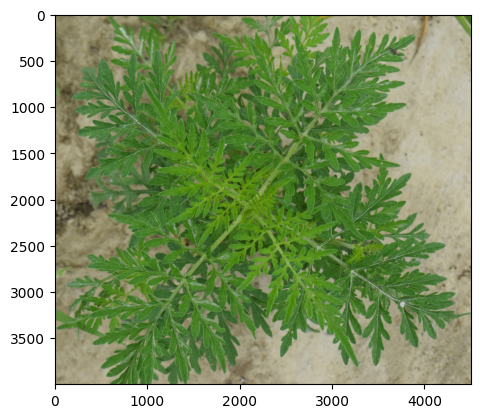

###############################################  6  ######################################################


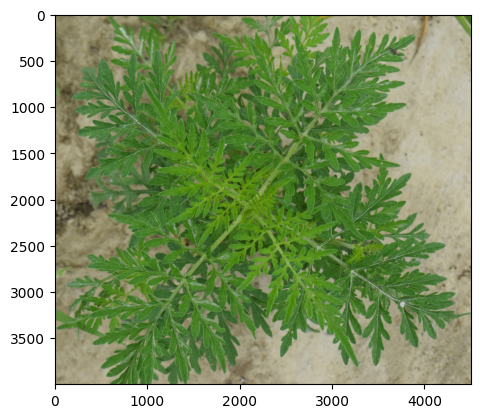

1/1 [==============================] - 0s 57ms/step
0.16965194046497345
Class probabilities: [[0.04593027 0.04842315 0.01766    0.0107967  0.02239528 0.0125436
  0.16965194 0.0284531  0.00830333 0.23659502 0.03673652 0.02573195
  0.13811845 0.17044976 0.02821095]]
Predicted class index: 9
Ragweed Ref_Images/Ragweed.jpg


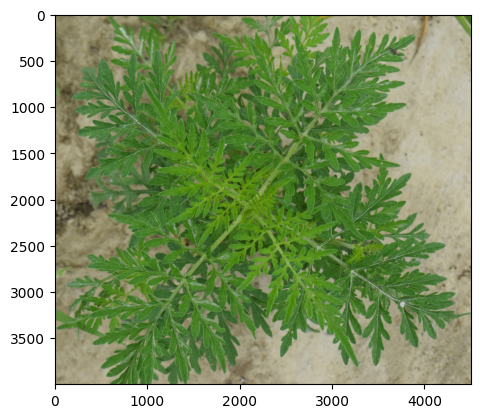

###############################################  7  ######################################################


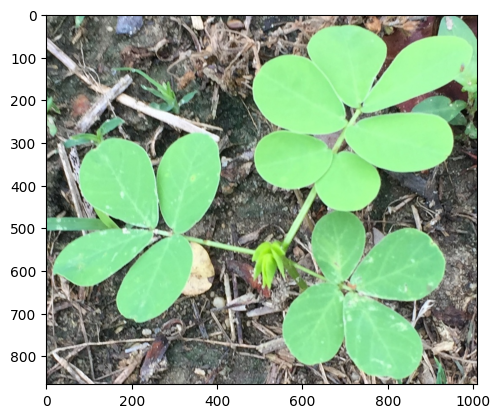

1/1 [==============================] - 0s 46ms/step
0.03499036282300949
Class probabilities: [[1.1309124e-06 4.1554040e-06 1.9175662e-03 5.7925285e-13 8.5796654e-02
  9.4892737e-03 1.7453752e-03 3.4990363e-02 4.7700075e-03 3.6006485e-04
  8.5969192e-01 2.7173886e-05 1.2061917e-03 5.0148432e-09 1.0753204e-09]]
Predicted class index: 10
Slicklepod Ref_Images/Slicklepod.jpg


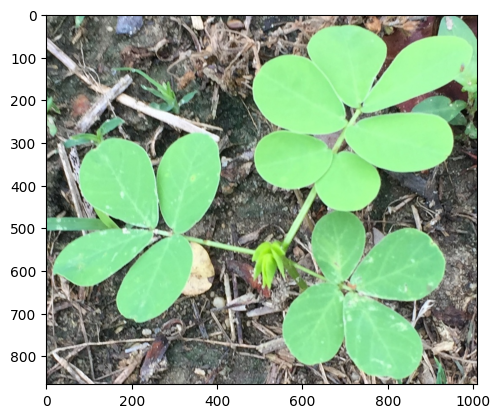

###############################################  8  ######################################################


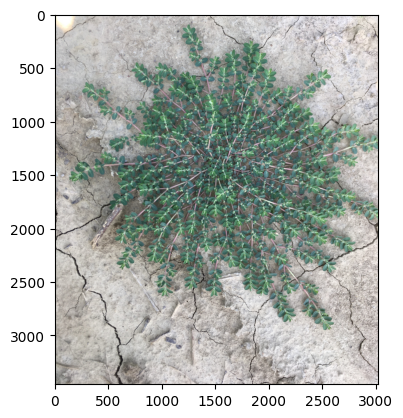

1/1 [==============================] - 0s 51ms/step
0.09737931191921234
Class probabilities: [[1.2631154e-02 2.4888487e-01 6.7439461e-03 3.9443228e-02 2.5529563e-03
  1.9721789e-02 6.5410458e-03 4.2778336e-02 9.7379312e-02 4.3314643e-02
  5.9987647e-03 4.1093087e-01 1.8971716e-04 1.7639002e-02 4.5250412e-02]]
Predicted class index: 11
SpottedSpurge Ref_Images/SpottedSpurge.jpeg


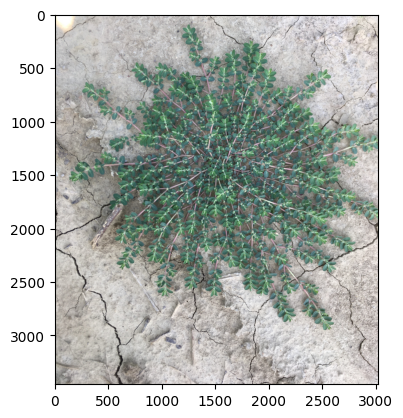

###############################################  9  ######################################################


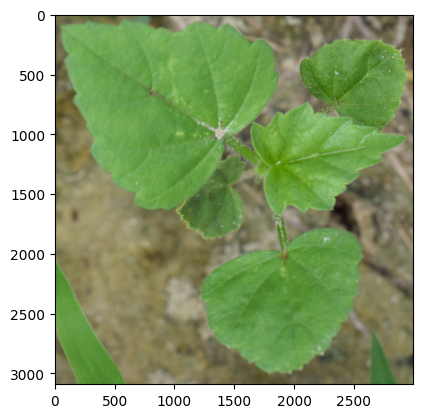

1/1 [==============================] - 0s 47ms/step
0.013575917109847069
Class probabilities: [[8.9621644e-05 2.2166017e-03 1.1935305e-02 7.0307574e-06 1.6549864e-03
  7.2991899e-03 3.7649430e-03 2.3501869e-02 4.3352458e-04 1.3575917e-02
  1.7199415e-01 2.4069485e-04 7.6310992e-01 4.3508062e-05 1.3275736e-04]]
Predicted class index: 12
SpurredAnoda Ref_Images/SpurredAnoda.jpg


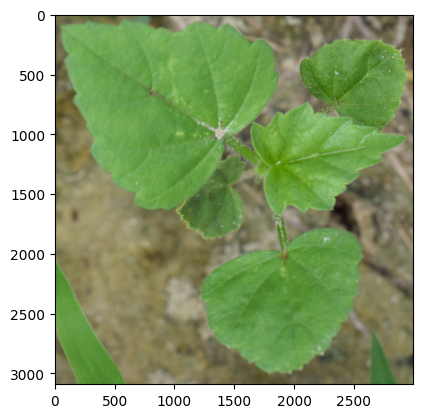

###############################################  10  ######################################################


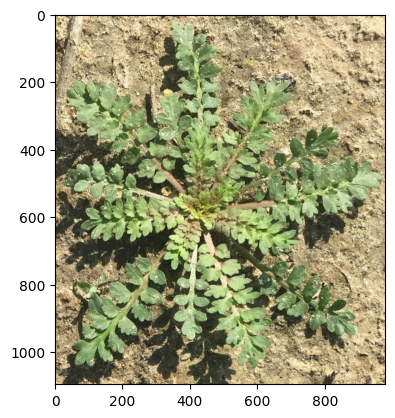

1/1 [==============================] - 0s 67ms/step
0.001599241979420185
Class probabilities: [[1.1967093e-03 2.4415925e-02 1.8408638e-03 4.5347111e-03 8.2994730e-04
  3.7454348e-03 5.2303679e-02 5.8852583e-03 5.9361339e-01 8.3730221e-02
  1.5992420e-03 1.7613634e-01 3.0222813e-05 3.4204792e-02 1.5933292e-02]]
Predicted class index: 8
Purslane Ref_Images/Purslane.jpg


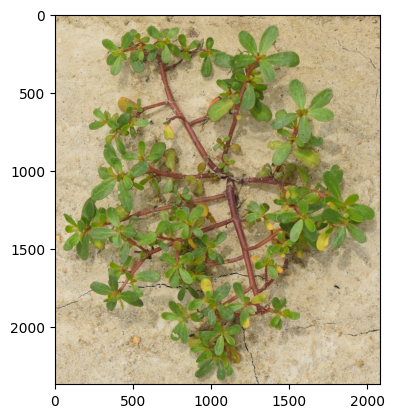

###############################################  11  ######################################################


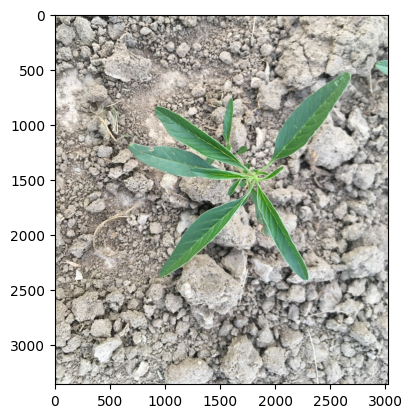

1/1 [==============================] - 0s 44ms/step
0.00898793712258339
Class probabilities: [[9.2366122e-04 1.6602615e-01 1.3194949e-02 1.2066463e-02 5.0238753e-04
  1.9447475e-03 6.3702965e-04 2.7510524e-04 1.4852169e-02 3.6890341e-03
  1.8689308e-02 8.9879371e-03 2.4358587e-06 5.3259026e-04 7.5767595e-01]]
Predicted class index: 14
Waterhemp Ref_Images/Waterhemp.jpeg


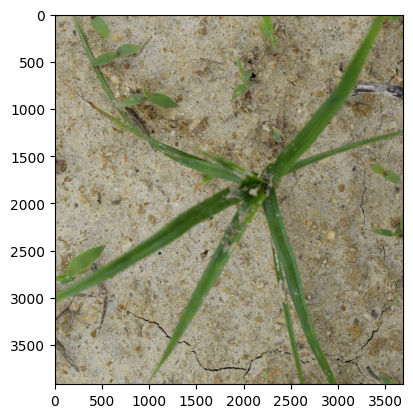

In [6]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from keras.models import load_model
List_image_to_predict = [
    # cv2.imread("Ref_Images/Carpetweeds.jpg", cv2.IMREAD_COLOR),        
    # cv2.imread("Ref_Images/Crabgrass.jpg", cv2.IMREAD_COLOR),
    cv2.imread("Ref_Images/Eclipta.jpeg", cv2.IMREAD_COLOR), 
    # cv2.imread("Ref_Images/Goosegrass.jpg", cv2.IMREAD_COLOR),
    cv2.imread("Ref_Images/Morningglory.jpg", cv2.IMREAD_COLOR),
    cv2.imread("Ref_Images/Nutsedge.jpg", cv2.IMREAD_COLOR),
    cv2.imread("Ref_Images/PricklySida.jpg", cv2.IMREAD_COLOR),
    cv2.imread("Ref_Images/PalmerAmaranth.jpg", cv2.IMREAD_COLOR),
    cv2.imread("Ref_Images/Purslane.jpg", cv2.IMREAD_COLOR),
    cv2.imread("Ref_Images/Ragweed.jpg", cv2.IMREAD_COLOR),
    cv2.imread("Ref_Images/Slicklepod.jpg", cv2.IMREAD_COLOR),
    cv2.imread("Ref_Images/SpottedSpurge.jpeg", cv2.IMREAD_COLOR),
    cv2.imread("Ref_Images/SpurredAnoda.jpg", cv2.IMREAD_COLOR),
    cv2.imread("Ref_Images/Swinecress.jpg", cv2.IMREAD_COLOR),
    cv2.imread("Ref_Images/Waterhemp.jpeg", cv2.IMREAD_COLOR)
]
# test image
for i in range (len(List_image_to_predict)) :
    print("############################################### ", i ," ######################################################")
    image_to_predict =  List_image_to_predict[i]
    img_to_predict = np.expand_dims(cv2.resize(image_to_predict, (200, 200)), axis=0)
    plt.imshow(cv2.cvtColor(image_to_predict, cv2.COLOR_BGR2RGB))
    plt.show()
    predictions = model.predict(img_to_predict)
    proba_scien = format(predictions[0][i])
    print(proba_scien)
    predicted_class = np.argmax(predictions)
    print("Class probabilities:", predictions)
    print("Predicted class index:", predicted_class)
    if predicted_class == 0:
        print("Carpetweed",image_Carpetweeds_path)
        plt.imshow(cv2.cvtColor(image_Carpetweeds, cv2.COLOR_BGR2RGB))
        plt.show()
    elif predicted_class == 1:
        print("Crabgrass",image_Crabgrass_path)
        plt.imshow(cv2.cvtColor(image_Crabgrass, cv2.COLOR_BGR2RGB))
        plt.show()
    elif predicted_class == 2:
        print("Eclipta", image_Eclipta_path)
        plt.imshow(cv2.cvtColor(image_Eclipta, cv2.COLOR_BGR2RGB))
        plt.show()
    elif predicted_class == 3:
        print("Goosegrass", image_Goosegrass_path)
        plt.imshow(cv2.cvtColor(image_Goosegrass, cv2.COLOR_BGR2RGB))
        plt.show()
    elif predicted_class == 4:
        print("Morningglory", image_Morningglorry_path)
        plt.imshow(cv2.cvtColor(image_Morningglorry, cv2.COLOR_BGR2RGB))
        plt.show()
    elif predicted_class == 5:
        print("Nutsedge",image_Nutsedge_path)
        plt.imshow(cv2.cvtColor(image_Nutsedge, cv2.COLOR_BGR2RGB))
        plt.show()
    elif predicted_class == 6:
        print("PalmerAmaranth",image_PalmerAmaranth_path)
        plt.imshow(cv2.cvtColor(image_PalmerAmaranth, cv2.COLOR_BGR2RGB))
        plt.show()
    elif predicted_class == 7:
        print("PricklySida",image_PricklySida_path)
        plt.imshow(cv2.cvtColor(image_PricklySida, cv2.COLOR_BGR2RGB))
        plt.show()
    elif predicted_class == 8:
        print("Purslane",image_Purslane_path)
        plt.imshow(cv2.cvtColor(image_Purslane, cv2.COLOR_BGR2RGB))
        plt.show()
    elif predicted_class == 9:
        print("Ragweed",image_Ragweed_path)
        plt.imshow(cv2.cvtColor(image_Ragweed, cv2.COLOR_BGR2RGB))
        plt.show()
    elif predicted_class == 10:
        print("Slicklepod",image_Slicklepod_path)
        plt.imshow(cv2.cvtColor(image_Slicklepod, cv2.COLOR_BGR2RGB))
        plt.show()
    elif predicted_class == 11:
        print("SpottedSpurge",image_SpottedSpurge_path)
        plt.imshow(cv2.cvtColor(image_SpottedSpurge, cv2.COLOR_BGR2RGB))
        plt.show()
    elif predicted_class == 12:
        print("SpurredAnoda",image_SpurredAnoda_path)
        plt.imshow(cv2.cvtColor(image_SpurredAnoda, cv2.COLOR_BGR2RGB))
        plt.show()
    elif predicted_class == 13:
        print("Swinecress",image_Swinecress_path)
        plt.imshow(cv2.cvtColor(image_Swinecress, cv2.COLOR_BGR2RGB))
        plt.show()
    elif predicted_class == 14:
        print("Waterhemp",image_Waterhemp_path)
        plt.imshow(cv2.cvtColor(image_Nutsedge, cv2.COLOR_BGR2RGB))
        plt.show()
    else:
        print("Class not recognized.")

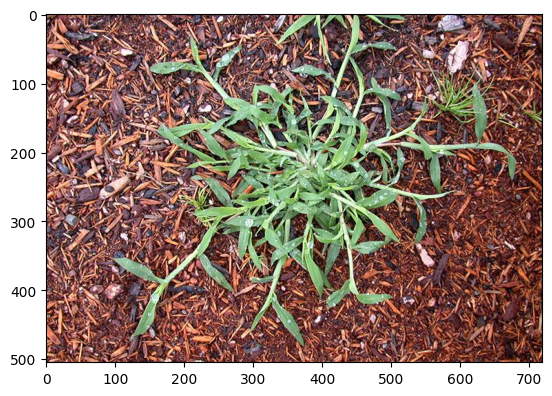

1/1 [==============================] - 0s 120ms/step
[[2.7126910e-03 3.5276559e-01 5.0981157e-03 6.0772896e-02 3.2968266e-04
  5.3791609e-03 1.4754216e-02 8.1208879e-03 1.9845633e-01 8.2353890e-02
  3.2590216e-03 1.4840783e-01 2.7332131e-05 7.5401716e-02 4.2160559e-02]]
Predicted class: Crabgrass


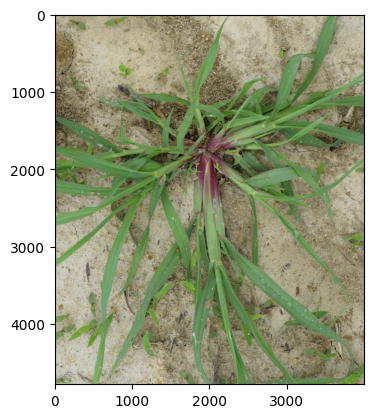

In [7]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from keras.models import load_model

fichier_save = os.path.abspath("batch64_epoch10.h5")
model = keras.models.load_model(fichier_save)

image_to_predict = "test/test5.jpg"


# Load the image using OpenCV
img_to_predict = cv2.imread(image_to_predict)

# Resize the image
img_to_predict = cv2.resize(img_to_predict, (200, 200))

# Expand dimensions to match the model's expected input shape
img_to_predict = np.expand_dims(img_to_predict, axis=0)

# Display the original image
plt.imshow(cv2.cvtColor(cv2.imread(image_to_predict), cv2.COLOR_BGR2RGB))
plt.show()

# Make predictions
predictions = model.predict(img_to_predict)
print(predictions)

# Get the predicted class index
predicted_class = np.argmax(predictions)

# Your class labels and corresponding images (replace with your actual paths)
class_labels = ["Carpetweed", "Crabgrass", "Eclipta", "Goosegrass", "Morningglory", "Nutsedge", 
                "PalmerAmaranth", "PricklySida", "Purslane", "Ragweed", "Slicklepod", "SpottedSpurge", 
                "SpurredAnoda", "Swinecress", "Waterhemp"]

class_images = [image_Carpetweeds, image_Crabgrass, image_Eclipta, image_Goosegrass, image_Morningglorry,
                image_Nutsedge, image_PalmerAmaranth, image_PricklySida, image_Purslane, image_Ragweed,
                image_Slicklepod, image_SpottedSpurge, image_SpurredAnoda, image_Swinecress, image_Waterhemp]

# Display the predicted class and corresponding image
if 0 <= predicted_class < len(class_labels):
    print("Predicted class:", class_labels[predicted_class])
    plt.imshow(cv2.cvtColor(class_images[predicted_class], cv2.COLOR_BGR2RGB))
    plt.show()
else:
    print("Class not recognized.")
